# This stable diffusion notebook is based on the huggingface documentation and is split into 3 main blocks.
1) Text to image

2) Image to image

3) Upscaling

## First we install the required libraries

In [1]:
!pip install diffusers
!pip install accelerate
!pip install transformers
!pip install torch
!pip install xformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Then connect google drive

In [2]:
from google.colab import drive

drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


### Here I have a folder specifically for the stable diffusion images

In [3]:
stable_diffusion_dir = "/content/gdrive/MyDrive/stable_diffusion"

## Import the libraries

In [4]:
from diffusers import StableDiffusionPipeline
import torch
from diffusers import DPMSolverMultistepScheduler
from diffusers import AutoencoderKL
from PIL import Image
from math import sqrt

## Here we could change the model used to other versions such as 2.0, 2.1 etc

In [5]:
model_id = "runwayml/stable-diffusion-v1-5"

## We establish the pipeline to optimise for speed following the recommendations from huggingface and making use of GPU

In [6]:
sd_pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype = torch.float16)
sd_pipe.scheduler = DPMSolverMultistepScheduler.from_config(sd_pipe.scheduler.config)
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype = torch.float16).to("cuda")
sd_pipe.vae = vae
sd_pipe = sd_pipe.to("cuda")
sd_pipe.enable_attention_slicing()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [39]:
def sd_get_inputs(prompt, neg_prompt, batch_size = 1, num_inference_steps = 50, start_seed = 1, h = 512, w = 512):
  '''
  This function will use the generator seed to allow for deterministic generation and therefore reproducibility
  Changing batch size allows us to generate x number of images
  Returns a dictionary with lists of length batch_size where only the seed changes in 1 increments from the start_seed
  '''
  print('For use with image_grid, please ensure batch_size is perfect sqaure (e.g. 2, 4, 8, 9 etc)')                                                                                                                                                                                                              
  generator = [torch.Generator("cuda").manual_seed(i + start_seed) for i in range(batch_size)]                                                                                                                                                         
  prompt = batch_size * [prompt]
  neg_prompt = batch_size * [neg_prompt]
  num_inference_steps = num_inference_steps
  h = h
  w = w

  return {"prompt": prompt, "negative_prompt": neg_prompt, "height": h, "width": w, "generator": generator, "num_inference_steps": num_inference_steps}                                                                                                                                              

In [37]:
def image_grid(imgs):
  '''
  Creates a grid based on the batch_size used in sd_get_inputs.
  Good to have used batch_sizes that map onto grid well such as perfect squares (4, 8, 9, 16).
  If number of images not easily fitted onto grid, will delete needed images with a warning.
  '''
  w, h = imgs[0].size
  total_imgs = len(imgs)
  per_sq = (int(sqrt(total_imgs)) ** 2 == total_imgs)
  if per_sq:
    rows = int(sqrt(total_imgs))
    cols = int(sqrt(total_imgs))
  elif (total_imgs < 6):
    rows = 1
    cols = total_imgs
  elif (total_imgs < 11):
    rows = 2
    cols = int(total_imgs / rows)
    total_grid = (cols * rows)
    if total_imgs > total_grid:
      imgs = imgs[:total_grid]
      print(f'Warning: {total_imgs - total_grid} images have been left out of grid')
  else:
    cols = int(sqrt(total_imgs))
    rows = int(total_imgs / cols)
    total_grid = (cols * rows)
    if total_imgs > total_grid:
      imgs = imgs[:total_grid]
      print(f'Warning: {total_imgs - total_grid} images have been left out of grid')

  grid = Image.new('RGB', size=(cols*w, rows*h))                                                                                                                                                                                            
                                                                                                                                                                                                                                            
  for i, img in enumerate(imgs):                                                                                                                                                                                                            
      grid.paste(img, box=(i%cols*w, i//cols*h))                                                                                                                                                                                            
  return grid

### Here are some example prompts that attempt to keep an ordered structure so prompts include all main important categories of keywords. Negative prompts are typically added once results have been produced and certain features, objects colours etc are specifically not wanted

In [41]:
subject = "((((robot)))) in photography studio holding flowers"
medium = "photo shoot"
style = "old sepia photograph"
artist = ""
website = ""
resolution = "sharp focus, hard rim lighting photography--beta"
additional_details = "[elephant skull], steampunk, historical photograph, archive photography"
color = "vintage"
lighting = ""
parts = [subject, medium, style, artist, website, resolution, additional_details, color, lighting]
parts = [part for part in parts if part != ""]
prompt = ", ".join(parts)

neg_prompt = "text, skin, ears, furniture"


In [ ]:
subject = "close up clouds of jupiter"
medium = "photograph"
style = "hyperrealistic"
artist = ""
website = ""
resolution = "sharp focus, 8k, high detail"
additional_details = "striking"
color = "bright, high contrast, rich earth tones"
lighting = ""
parts = [subject, medium, style, artist, website, resolution, additional_details, color, lighting]
parts = [part for part in parts if part != ""]
prompt = ", ".join(parts)
neg_prompt = "yellow, fuzzy"

## Here we call the 2 functions to generate the images of a given batch_size. We can also set the "nis" which has 50 steps as default to something lower for faster results if large number of images being generated

For use with image_grid, please ensure batch_size is perfect sqaure (e.g. 2, 4, 8, 9 etc)


  0%|          | 0/3 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


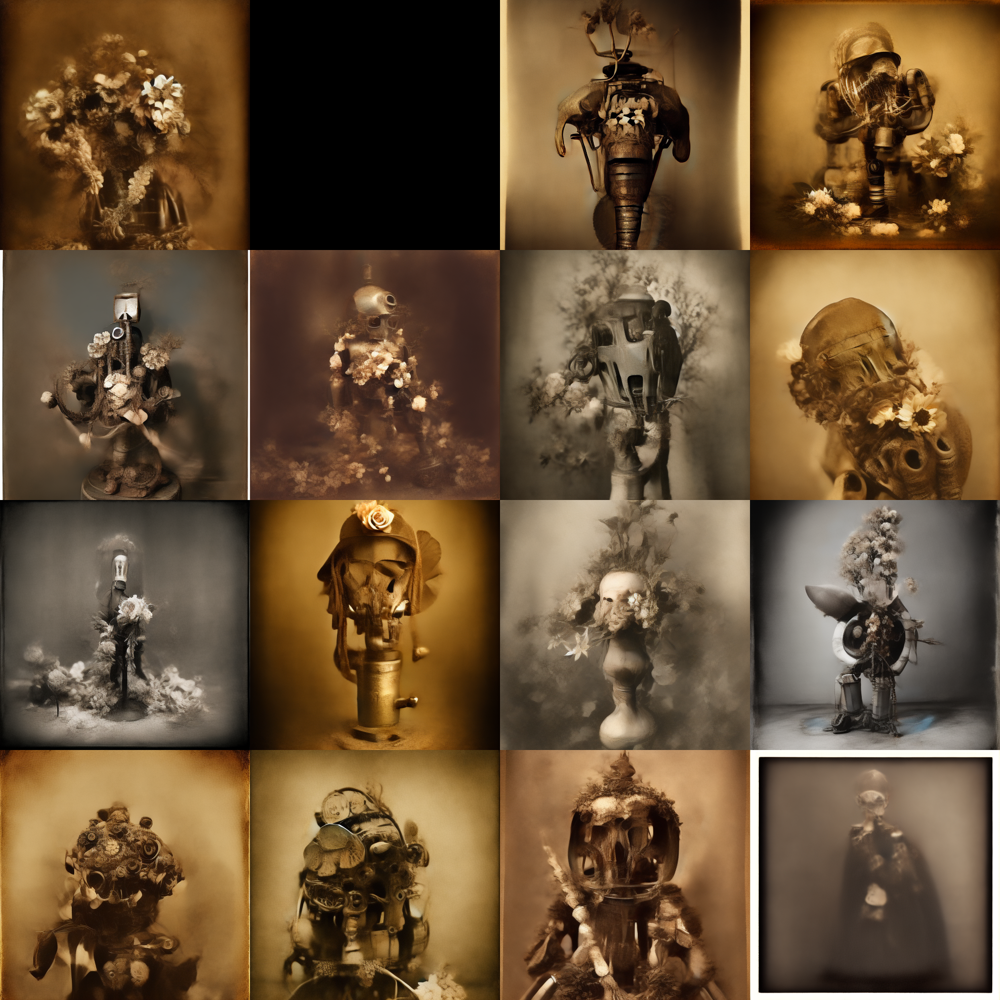

In [43]:
images = sd_pipe(**sd_get_inputs(prompt = prompt, neg_prompt = neg_prompt, batch_size = 16, num_inference_steps = 3)).images                                                                                                                                                                                           
image_grid(images)

## Using the google drive connection, we can save all images created

In [47]:
subject_name = subject.replace(', ', '').replace(' ', '_')
for i, image in enumerate(images):
  image.save(f"{stable_diffusion_dir}/{subject_name}_{i}.png")

# Now to use img to img

## We import the necessary pipeline

In [45]:
from diffusers import StableDiffusionImg2ImgPipeline

### Clean up cache

In [ ]:
torch.cuda.empty_cache()

## And the base image we want to modify

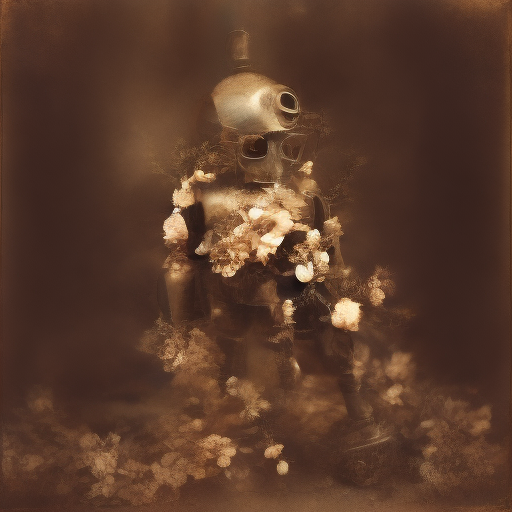

In [48]:
base_img = Image.open(f'{stable_diffusion_dir}/((((robot))))_in_photography_studio_holding_flowers_5.png')
base_img

## We establish the pipeline modifications to boost speed and use GPU

In [49]:
pipe_img2img = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype = torch.float16)
pipe_img2img.scheduler = DPMSolverMultistepScheduler.from_config(pipe_img2img.scheduler.config)
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse", torch_dtype=torch.float16).to("cuda")
pipe_img2img.vae = vae
pipe_img2img = pipe_img2img.to("cuda")
pipe_img2img.enable_attention_slicing()

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


## Using the prompt structure, we generate a new prompt to modify our base image

In [55]:
subject = "elephant skull sculpture"
medium = "photograph"
style = "studio portrait, streampunk, wooden, brass"
artist = ""
website = ""
resolution = "sharp focus, hard rim lighting photography--beta, 8k"
additional_details = "jewels, gold"
color = "iridescent"
lighting = ""
parts = [subject, medium, style, artist, website, resolution, additional_details, color, lighting]
parts = [part for part in parts if part != ""]
new_prompt = ", ".join(parts)

neg_prompt = ""

In [52]:
def img_2_img_grid(base_img, seed = 1):
  '''
  Here we define a function that creates 16 (4x4) images spanning a range of strength and guidance_scales values
  '''
  images = []
  strengths = [0.2, 0.4, 0.6, 0.8]
  guidance_scales = [5, 8, 11, 15]
  for strength in strengths:
    for g_s in guidance_scales:
      images.append(pipe_img2img(prompt = new_prompt,
                                 image = base_img,
                                 strength = strength,
                                 guidance_scale = g_s,
                                 generator = torch.Generator("cuda").manual_seed(seed)).images[0])
  return images                                                                                                                                         

In [56]:
images = img_2_img_grid(base_img)
img_grid = image_grid(images)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

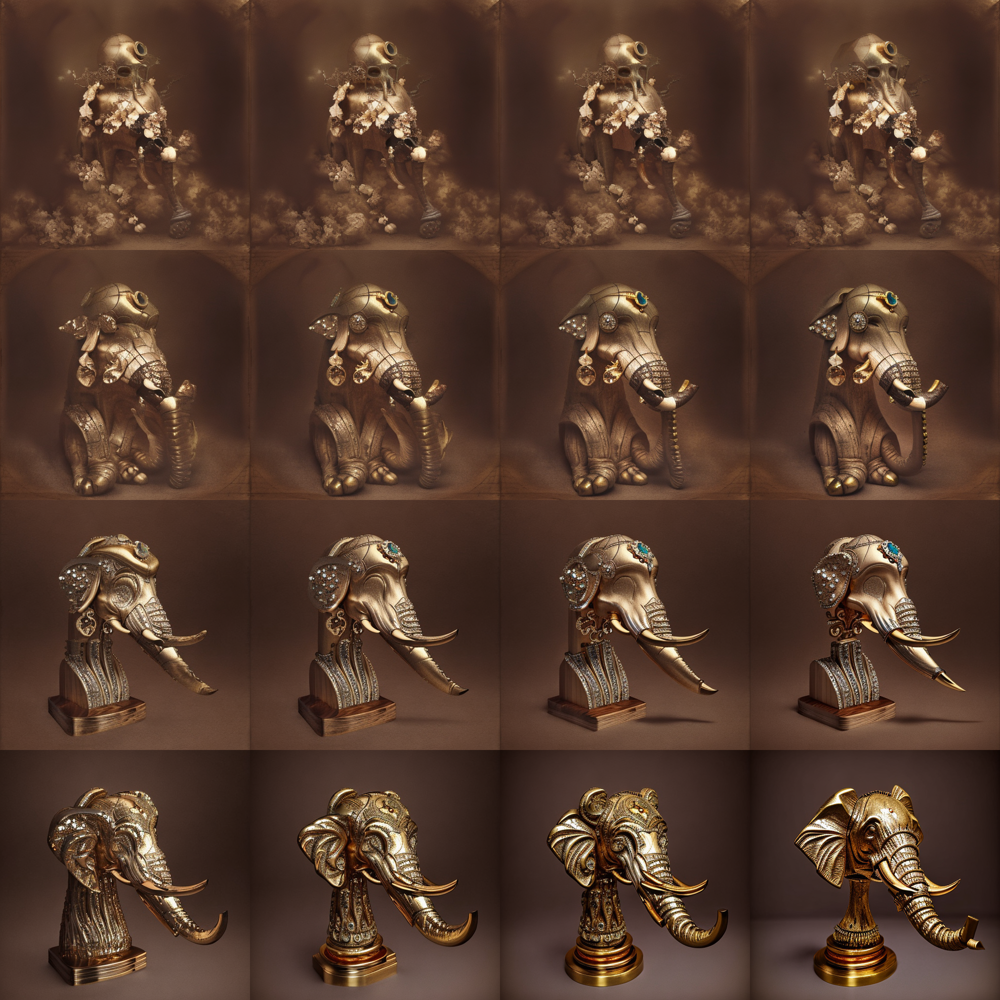

In [57]:
img_grid

## We make a new directory based on the new prompt subject and save the images

In [58]:
import os
subject_name = subject.replace(',', '').replace(' ', '_')
img2img_dir = f'{stable_diffusion_dir}/img2img/{subject_name}'
try:
  os.mkdir(img2img_dir)
except FileExistsError:
  pass

for i, image in enumerate(images):
  image.save(f"{img2img_dir}/{subject_name}_{i}.png")

img_grid.save(f"{img2img_dir}/img_grid.png")

# Now upscale to super high resolution

## Import the scale up pipeline and xformers for increased memory usage. This uses a lot of memory

In [6]:
from diffusers import StableDiffusionUpscalePipeline
from xformers.ops import MemoryEfficientAttentionFlashAttentionOp

## Select the upscale model id

In [7]:
upscale_model_id = "stabilityai/stable-diffusion-x4-upscaler"

### This may or may not help!



In [8]:
torch.backends.cuda.matmul.allow_tf32 = True

## Establish the pipline attempting to use memory as efficiently as possible

In [21]:
upscale_pipe = StableDiffusionUpscalePipeline.from_pretrained(upscale_model_id, 
                                                          revision = "fp16", 
                                                          torch_dtype = torch.float16)
upscale_pipe = upscale_pipe.to("cuda")
upscale_pipe.enable_attention_slicing()
upscale_pipe.enable_xformers_memory_efficient_attention(attention_op = MemoryEfficientAttentionFlashAttentionOp)
upscale_pipe.vae.enable_xformers_memory_efficient_attention(attention_op = None)
upscale_pipe.enable_sequential_cpu_offload()

## Set our base image we want to upscale

In [22]:
to_upscale = Image.open(f'{stable_diffusion_dir}/img2img/elephant_skull_sculpture/elephant_skull_sculpture_2.png')

## Here we can either set the same prompt as originally used or simply a generic one that captures the basics. 

In [27]:
upscale_prompt = "moody paining of elephant sculpture surrounded by flowers"

## This helps to free up space before running the up scaling

In [32]:
torch.cuda.empty_cache()

## Now we run the upscale pipe. This has a default of 70 but this typically does not complete on a T4 GPU on colab whereas 40 does. This itself only works when the runtime has been restarted and RAM is close to empty prior to running as it needs ~13GB. 

In [29]:
upscaled_image = upscale_pipe(prompt = upscale_prompt,
                              image = to_upscale,
                              num_inference_steps = 40).images[0]

  0%|          | 0/40 [00:00<?, ?it/s]

## Now we can save the high resolution (2048x2048) image to file.

In [30]:
import os
upscaled_dir = f'{stable_diffusion_dir}/upscaled'
try:
  os.mkdir(upscaled_dir)
except FileExistsError:
  pass

upscale_prompt = upscale_prompt.replace(',', '').replace(' ', '_')

upscaled_image.save(f"{upscaled_dir}/{upscale_prompt}.png")

In [ ]:
upscaled_image